## Note: this is the final version of this notebook. Several versions of this and the following notebooks (12th, 13th, and 14th) were run several times before removing cluster(s) of low-quality clusters.

In [1]:
import scanpy as sc
import scanpy.external as sce
#sc.logging.print_versions()
#sc.logging.print_memory_usage()
#sc.settings.verbosity = 2
import os,sys
import datetime
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
import matplotlib.ticker as mticker

In [ ]:
# add the utility function folder to PATH
sys.path.append(os.path.abspath("utility_functions"))

from rz_import_statements import *
import rz_functions as rz
import rz_fig_params # this adjust mpl.rcParams, almost nothing to import, import after scanpy to overwrite rc.Params
import rz_utility_spring as srz


# Load data

In [ ]:
adata = sc.read_h5ad('backups/clean_good_cells_15372x2000_231009_10h46.h5ad')    

In [ ]:
adata = adata.raw.to_adata()

In [ ]:
#load the newest obs with doublet and RBC removal
filename = 'backups/obs_info_wo_dblt2_18088x17_231001_18h25.npz'
encoding = 'latin1'

with np.load(filename,encoding=encoding, allow_pickle = True) as f:
    obs = pd.DataFrame(**f)

# Normalize counts

In [8]:
path1 = "/Users/karolisgoda/Library/CloudStorage/GoogleDrive-karolisgoda@gmail.com/My Drive/MF/data/SPRING_dev-master/data/" 
project_dir = path1+'CD34/clean'

In [9]:
#save not normalized counts as adata.raw, can normalize any time if needed
adata.raw = adata

In [10]:
sc.pp.normalize_per_cell(adata,counts_per_cell_after=1e4)


In [11]:
adata.X.sum(axis = 1)


matrix([[10000.   ],
        [10000.001],
        [10000.   ],
        ...,
        [10000.   ],
        [10000.   ],
        [10000.001]], dtype=float32)

In [18]:
#srz.save_counts_for_spring(adata,project_dir)
#project_dir

saving for quick loading of genes...
saving for quick loading of cells...
saving as npz...
done


'/Users/karolisgoda/Library/CloudStorage/GoogleDrive-karolisgoda@gmail.com/My Drive/MF/data/SPRING_dev-master/data/CD34/clean'

## Select cells to keep, log-transform and z-score, choose parameters for graph construction that will be used for both SPRING (Weinreb et al., 2018) and UMAP

In [12]:
cdata = adata[cell_mask].copy() # not all cells in this case

In [13]:

# save a copy of data before taking the log:
cdata.layers['X_lin_cptt'] = cdata.X.copy() # for X linear counts-per-10-thousand

# log transform
sc.pp.log1p(cdata)

# zscore
sc.pp.scale(cdata)

# keep a copy of the data:
cdata.layers['X_log_z'] = cdata.X.copy()

In [14]:
cdata.layers['X_lin_cptt'].sum(axis=1)

matrix([[10000.   ],
        [10000.001],
        [10000.   ],
        ...,
        [10000.   ],
        [10000.   ],
        [10000.001]], dtype=float32)

In [15]:


# chose a name for the spring subplot
plot_name = 'clean_good_cells'

# chose dataset for selecting abundant and variable genes
# here I use linear counts-per-10k

E = cdata.layers['X_lin_cptt']

# in an attempt to be more organized I keep a log of spring parameter and intermediate data structures used in
# the form of an unstructured annotation as part of an AnnData object.

srz.start_spring_params(cdata,plot_name)

# print the newly created dictionary, also define a variable to access it faster:
pdict = cdata.uns['spring_params'][plot_name]
pdict

{'k': 5,
 'cell_mask': array([ True,  True,  True, ...,  True,  True,  True]),
 'min_counts': 3,
 'min_cells': 3,
 'base_ix': array([    0,     1,     2, ..., 15369, 15370, 15371]),
 'num_pc': 20,
 'plot_name': 'clean_good_cells'}

In [16]:
# overwrite some of the parameters for SPRING
pdict['cell_mask'] = cell_mask # record which cell out of all were used
pdict['k'] = 10

pdict['min_counts'] = 10
pdict['min_cells'] = 5
pdict['embedding'] = 'umap'

print(len(pdict['base_ix']))

15372


### Gene selection criteria

In [17]:
# avoid genes starting with
toavoid = ['MT-','RPS','RPL','MRPL','MRPS']
for i in toavoid:
    print(i)
    print([g for g in adata.var_names if g.startswith(i)])
    print()
    print()

MT-
['MT-ND1', 'MT-ND2', 'MT-CO1', 'MT-CO2', 'MT-ATP8', 'MT-ATP6', 'MT-CO3', 'MT-ND3', 'MT-ND4L', 'MT-ND4', 'MT-ND5', 'MT-ND6', 'MT-CYB']


RPS
['RPS6KA1', 'RPS8', 'RPS27', 'RPS6KC1', 'RPS7', 'RPS27A', 'RPSA', 'RPS3A', 'RPS23', 'RPS14', 'RPS18', 'RPS10-NUDT3', 'RPS10', 'RPS12', 'RPS6KA2', 'RPS6KA2-IT1', 'RPS6KA2-AS1', 'RPS20', 'RPS6', 'RPS24', 'RPS13', 'RPS6KA4', 'RPS6KB2', 'RPS6KB2-AS1', 'RPS3', 'RPS25', 'RPS26', 'RPS29', 'RPS6KL1', 'RPS6KA5', 'RPS27L', 'RPS17', 'RPS2', 'RPS15A', 'RPS6KB1', 'RPS15', 'RPS28', 'RPSAP58', 'RPS16', 'RPS19', 'RPS11', 'RPS9', 'RPS5', 'RPS21', 'RPS19BP1', 'RPS6KA3', 'RPS4X', 'RPS6KA6', 'RPS4Y1', 'RPS4Y2']


RPL
['RPL22', 'RPL11', 'RPL5', 'RPL31', 'RPL37A-DT', 'RPL37A', 'RPL32', 'RPL15', 'RPL14', 'RPL29', 'RPL24', 'RPL22L1', 'RPL39L', 'RPL35A', 'RPL9', 'RPL34-DT', 'RPL34', 'RPL37', 'RPL26L1-AS1', 'RPL26L1', 'RPL10A', 'RPL7L1', 'RPL7', 'RPL30', 'RPL30-AS1', 'RPL8', 'RPL35', 'RPL12', 'RPL7A', 'RPLP2', 'RPL27A', 'RPL41', 'RPL6', 'RPLP0', 'RPL21', 'RPL10L', 'RPL3

In [18]:
# genes to exclude:
exclude_gene_names = []
for j in toavoid:
    exclude_gene_names.append([i for i in adata.var_names if i.startswith(j)])
exclude_gene_names = rz.flatten_list_of_lists(exclude_gene_names)

pdict['gene_names_excluded'] = exclude_gene_names
print('%d genes excluded based on name'%len(exclude_gene_names))


##########################################################################################

# filter on abundance:
pdict['abundant_gene_mask'] = srz.filter_abund_genes(
                                                     E[pdict['base_ix'],:],
                                                     pdict['min_counts'],
                                                     pdict['min_cells']
                                                    )

205 genes excluded based on name
3091 genes passing abundance filter


In [19]:
# combine gene filters so far
undesired = list(pdict['gene_names_excluded'])+\
            list(cdata.var_names[~pdict['abundant_gene_mask']])

print(len(undesired))
undesired = list(set(undesired))
print(len(undesired))

# boolean mask
combmask = ~np.in1d(cdata.var_names,undesired)
print(combmask.sum(),'surviving genes so far')

34847
34787
2946 surviving genes so far


In [20]:
# calculate v score (Klein et al., 2015, see equation S4 and S13) for all non-zero genes
# the function automatically removes genes with zero expression, but better
# to get rid of these in advance at this point.

isexpr = np.array(E[pdict['base_ix'],:].sum(axis=0))[0]>0
print('%d genes with non-zero expression'%sum(isexpr))
pdict['v_score_dict'] = srz.vscores(E[pdict['base_ix'],:][:,isexpr])

# print the number of genes with v scores above mode
# these but not more can be considered variable

maxvar = pdict['v_score_dict']['var_gene_mask'][combmask[isexpr]].sum()
print("Out of the surviving genes, %d have a v-score above mode"%maxvar)

23779 genes with non-zero expression
Out of the surviving genes, 2429 have a v-score above mode


In [21]:
# out of the surviving genes, select a fix number of most variable ones
# this is one of the possible strategies
nrvar = maxvar
pdict['nr_var_genes'] = nrvar

# place v score and gene names into a temporary pd.Series for convenience:
v = pd.Series(pdict['v_score_dict']['v_scores'],index=cdata.var_names[isexpr])


# get the names of the top most variable genes:
pdict['genes_used'] = v[combmask[isexpr]].sort_values(ascending=False)[:nrvar].index

# plot a v score vs mean plot with genes used further colored in red
ff = pdict['v_score_dict']['ff_gene']
mu = pdict['v_score_dict']['mu_gene']
finalmask = np.in1d(cdata.var_names,pdict['genes_used'])

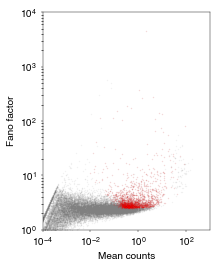

In [22]:
# check scatter
s = 2
plt.figure(figsize=(3,4))
plt.scatter(mu,ff,lw=0,color='0.5',alpha=0.1,s=s)
plt.scatter(mu[finalmask[isexpr]],ff[finalmask[isexpr]],lw=0,color='r',alpha=0.1,s=s)
plt.xscale('log');
plt.yscale('log');
plt.xlim(0.0001,1000)
plt.ylim(1,10000)
plt.xlabel('Mean counts')
plt.ylabel('Fano factor');
#plt.savefig(project_dir, dpi = 600)

### Apply gene filter and perform PCA

In [23]:
# leave only genes defined as variable, overwrite
print(cdata.shape)
finalmask = np.in1d(cdata.var_names,pdict['genes_used'])
cdata = cdata[:,finalmask]
print(cdata.shape)

(15372, 37733)
(15372, 2000)


In [24]:
# Z score was calculated already
Z = cdata.X.copy()

In [25]:
# find the number of non-random PCs
d = srz.find_num_pc(Z[pdict["base_ix"],:],sparse=False)

calculating the first 200 observed eigenvalues...
calculating the random eigenvalues for 10 rounds of shuffling...
1 	 38 	 0.16 min.
2 	 38 	 0.27 min.
3 	 38 	 0.39 min.
4 	 37 	 0.51 min.
5 	 38 	 0.62 min.
6 	 37 	 0.74 min.
7 	 37 	 0.85 min.
8 	 38 	 0.96 min.
9 	 37 	 1.08 min.
10 	 37 	 1.19 min.


In [26]:
# record results to log:
pdict['num_pc'] = d['num_pc']
pdict['eigenvectors'] = d['pca'].components_
pdict['eigenvalues'] = d['pca'].explained_variance_


print(d['num_pc'])


37


In [27]:
# apply dimensionality reduction on Z (get principle components)
# note, that eigenvalues can be calculated for base_ix only
# make sure to provide a dense matrix Z

P = pdict['eigenvectors'][:pdict['num_pc'],:].dot(Z.T).T
print(P.shape)

(15372, 37)


In [28]:
#store these values in adata as if scanpy pca was ran

In [29]:
cdata.obsm['X_pca'] = P
cdata.varm['PCs'] = pdict['eigenvectors'][:pdict['num_pc'],:].T
cdata.uns['pca'] = {}
cdata.uns['pca']['variance'] = pdict['eigenvalues']

## Batch correction using Harmony

In [30]:
sce.pp.harmony_integrate(cdata, 'conditions2', max_iter_harmony = 25)

2023-10-09 10:57:38,213 - harmonypy - INFO - Iteration 1 of 25
2023-10-09 10:57:40,569 - harmonypy - INFO - Iteration 2 of 25
2023-10-09 10:57:42,687 - harmonypy - INFO - Iteration 3 of 25
2023-10-09 10:57:44,861 - harmonypy - INFO - Iteration 4 of 25
2023-10-09 10:57:46,688 - harmonypy - INFO - Iteration 5 of 25
2023-10-09 10:57:48,510 - harmonypy - INFO - Iteration 6 of 25
2023-10-09 10:57:50,273 - harmonypy - INFO - Iteration 7 of 25
2023-10-09 10:57:52,033 - harmonypy - INFO - Converged after 7 iterations


In [31]:
#just checking if the batch correction worked properly, will adjust neighbor number or umap parameters later
sc.pp.neighbors(cdata, 30, use_rep = 'X_pca_harmony')
sc.tl.umap(cdata, min_dist = 0.5, random_state = 42)

/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


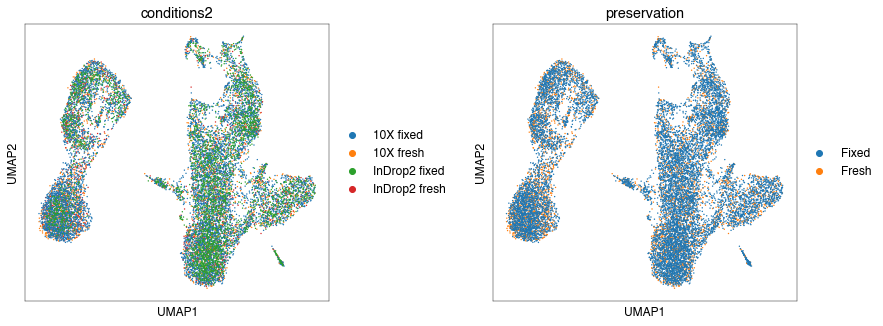

In [32]:
mpl.rcParams['figure.figsize'] = (5,5)
plt.rcParams.update({'font.size': 12})
sc.pl.umap(cdata, color = ['conditions2', 'preservation'], ncols = 2, wspace = 0.4, save = False)

In [33]:
#find parameters for fa graph
neighbor_list = [15, 20, 25, 50]

15 neighbors


/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


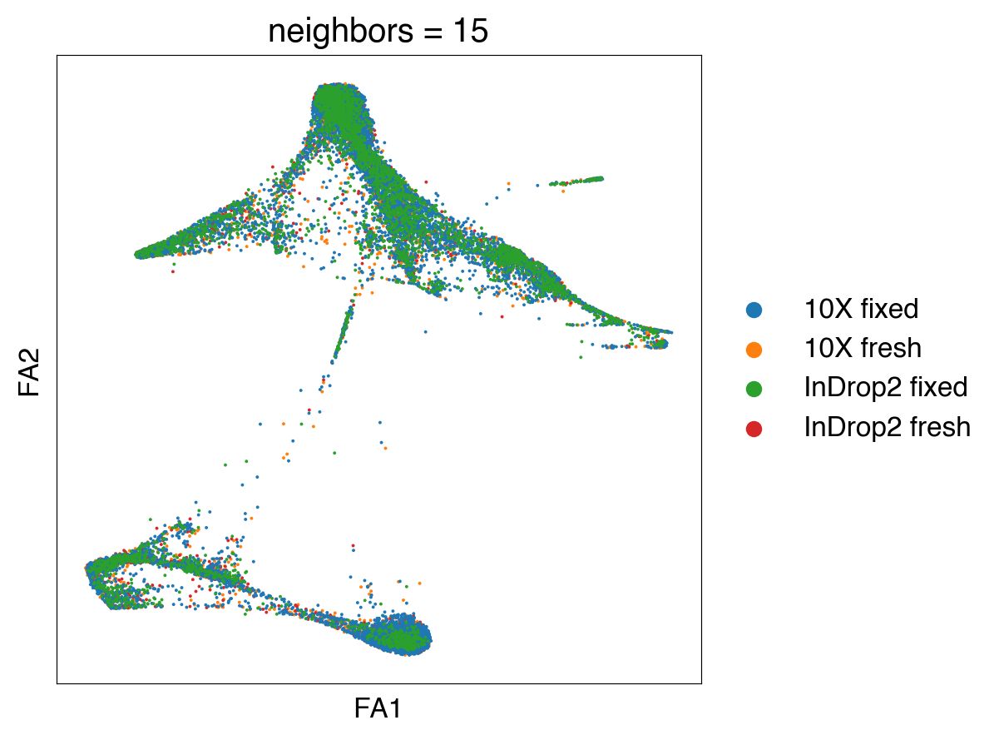

20 neighbors


/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


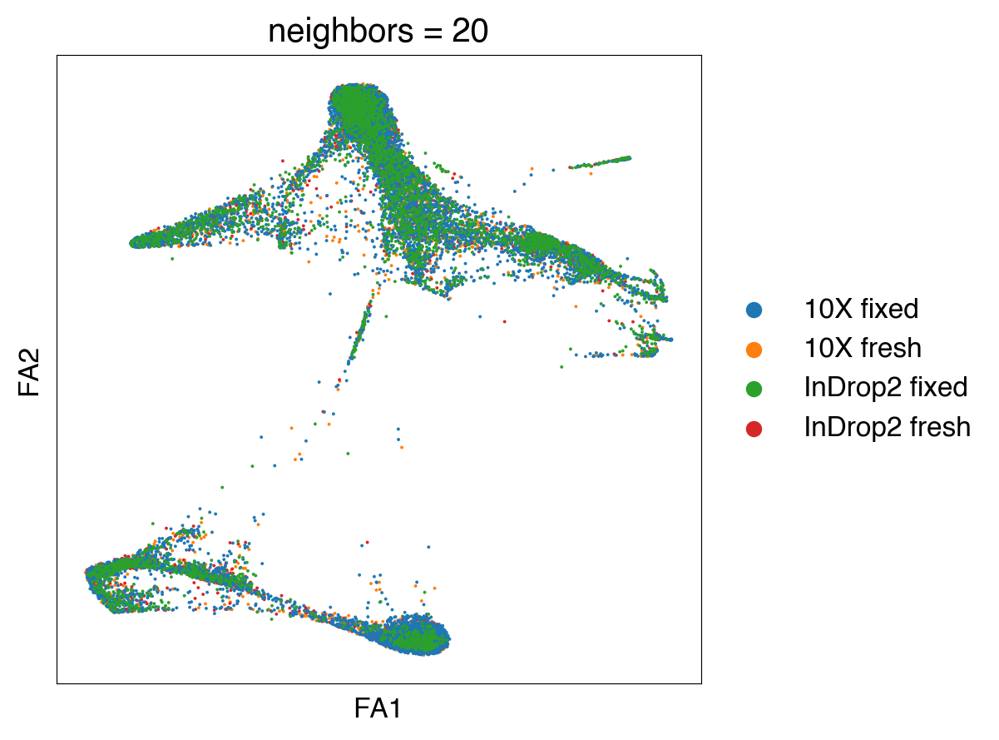

25 neighbors


/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


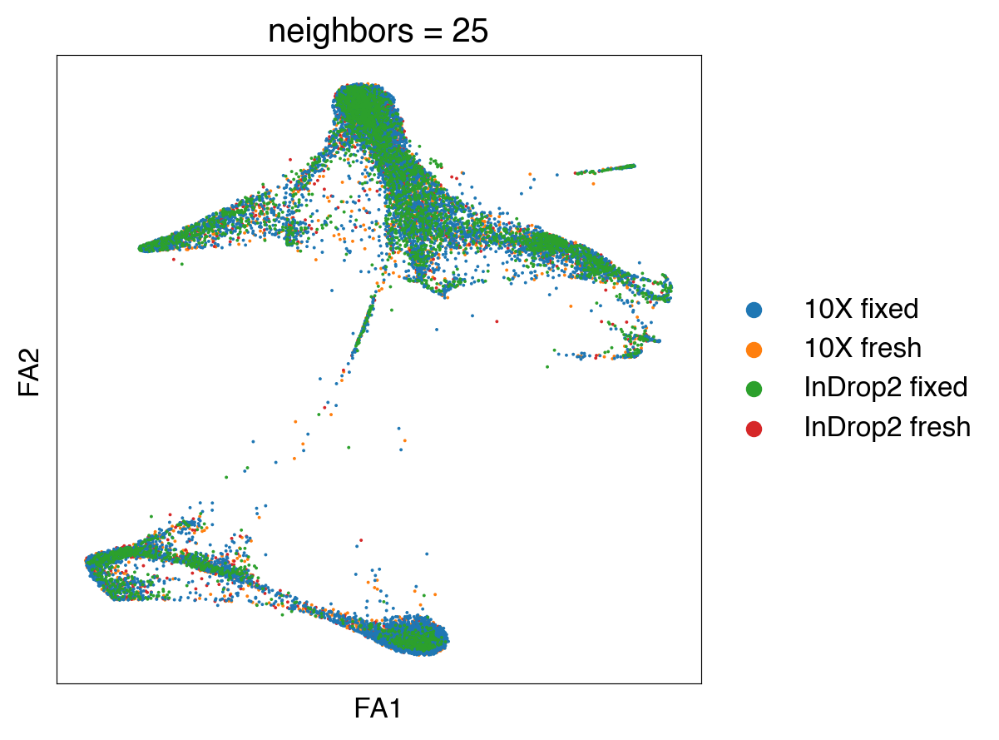

50 neighbors


/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


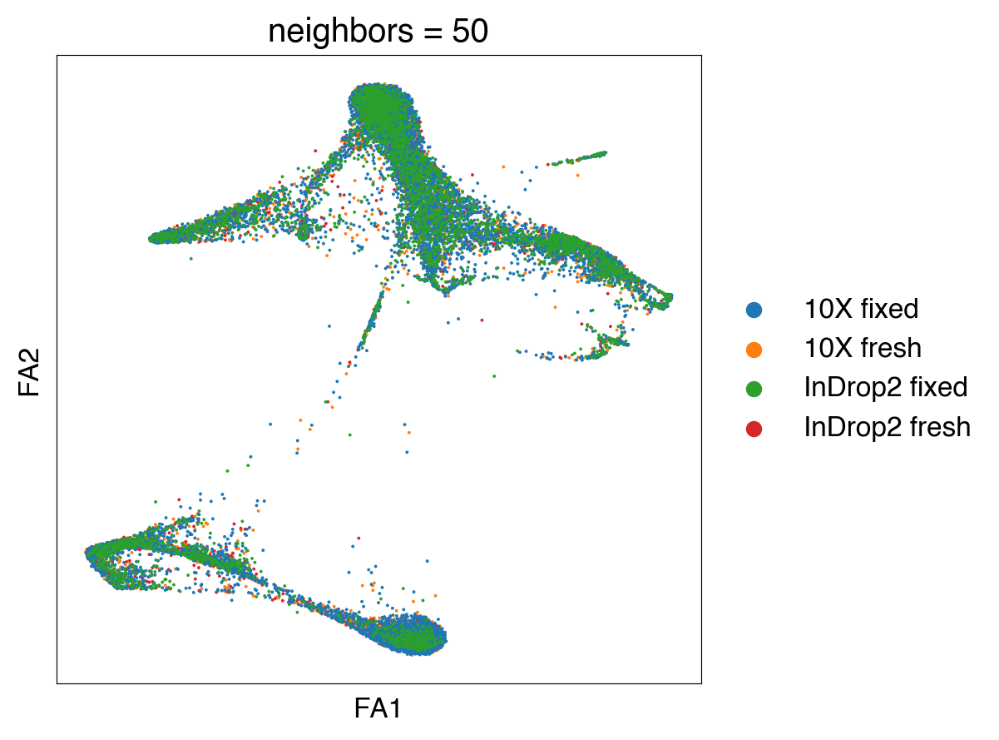

In [35]:
for j in neighbor_list:
    k = j
    print(k, 'neighbors')
    sc.pp.neighbors(cdata,k, use_rep = 'X_pca_harmony')
    sc.tl.draw_graph(cdata, random_state = 69)
    mpl.rcParams['figure.figsize'] = (5,5)
    mpl.rcParams['figure.dpi']= 200
    sc.pl.draw_graph(cdata, color = 'conditions2', title = 'neighbors = %s'%j,
               save ='clean_good_fa, neighbors = %s.png'%j)
    

In [42]:
sc.pp.neighbors(cdata, 20 ,use_rep='X_pca_harmony')
sc.tl.draw_graph(cdata, random_state = 69, layout = 'fa')

## Choose the "optimal" UMAP parameters

In [45]:
neighbor_list = [15, 20, 25, 30, 50]
dist_list = [0.1, 0.2, 0.3, 0.5]


15 neighbors


/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


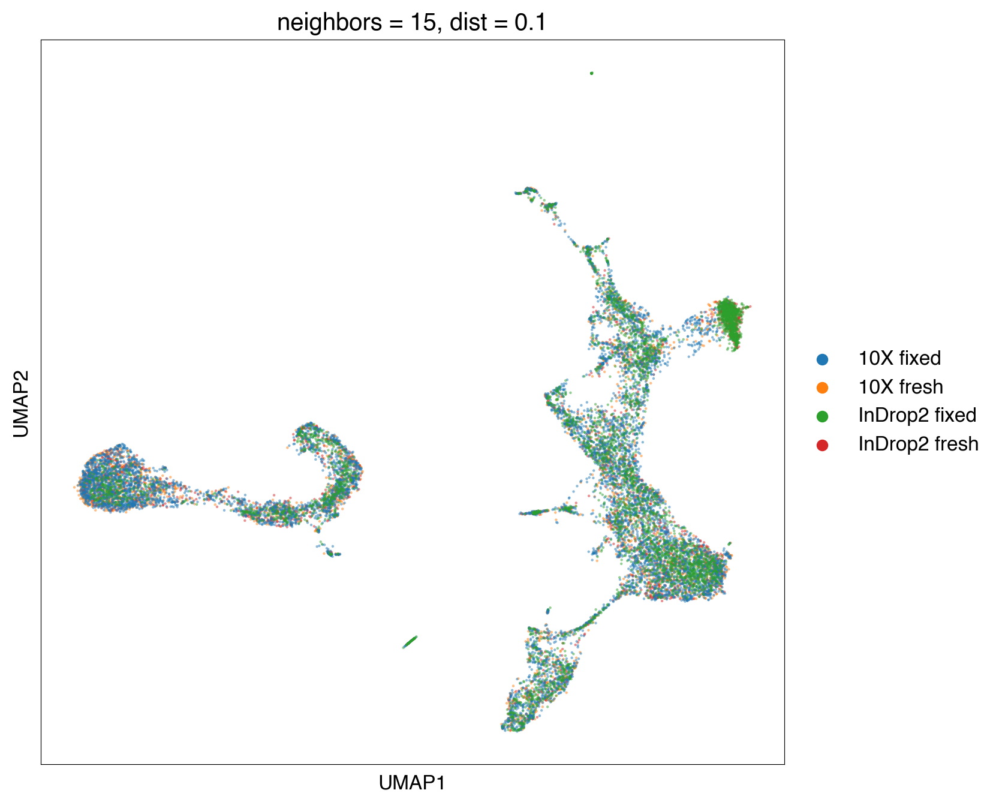

/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


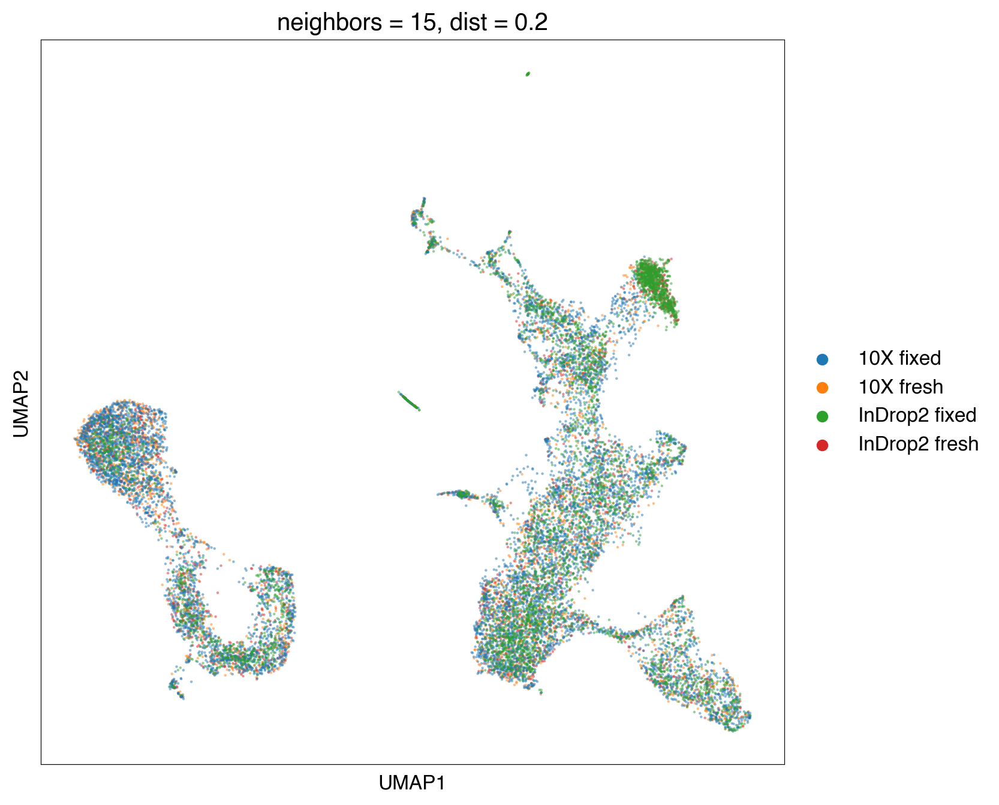

/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


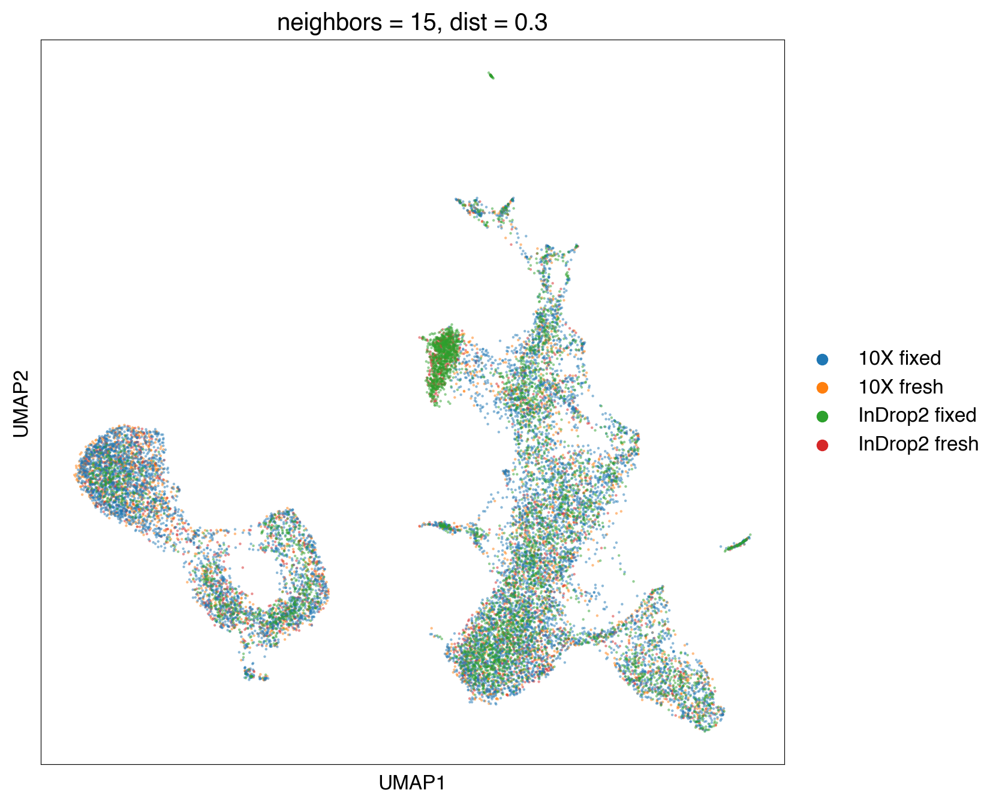

/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


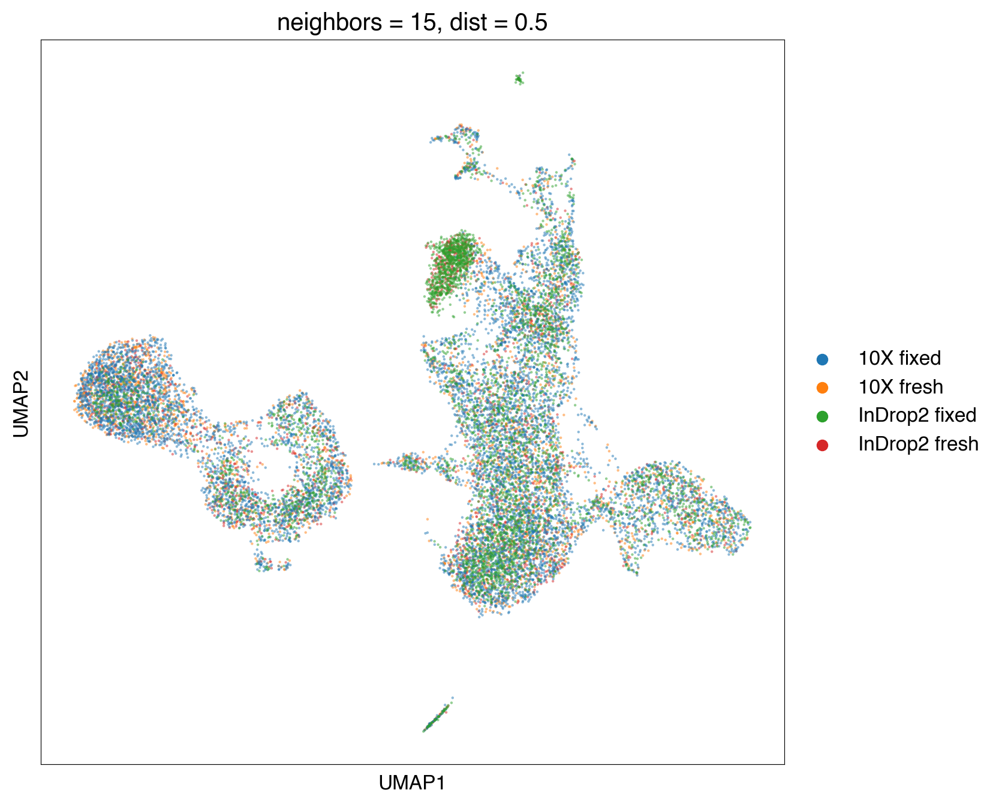

20 neighbors


/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


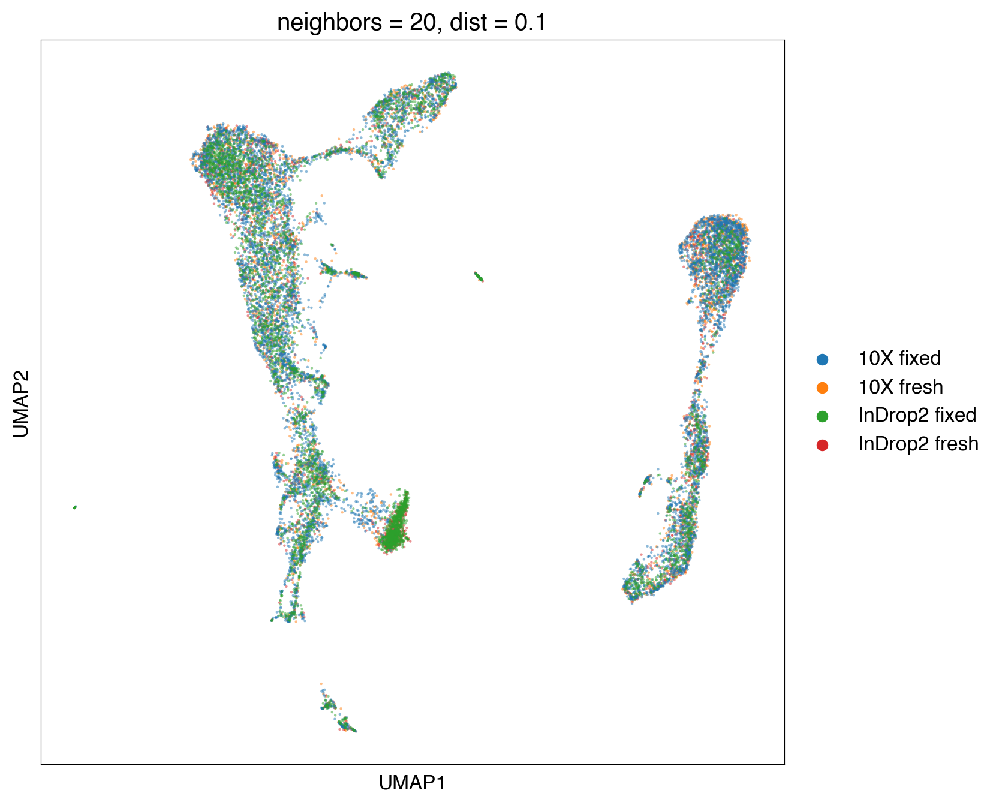

/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


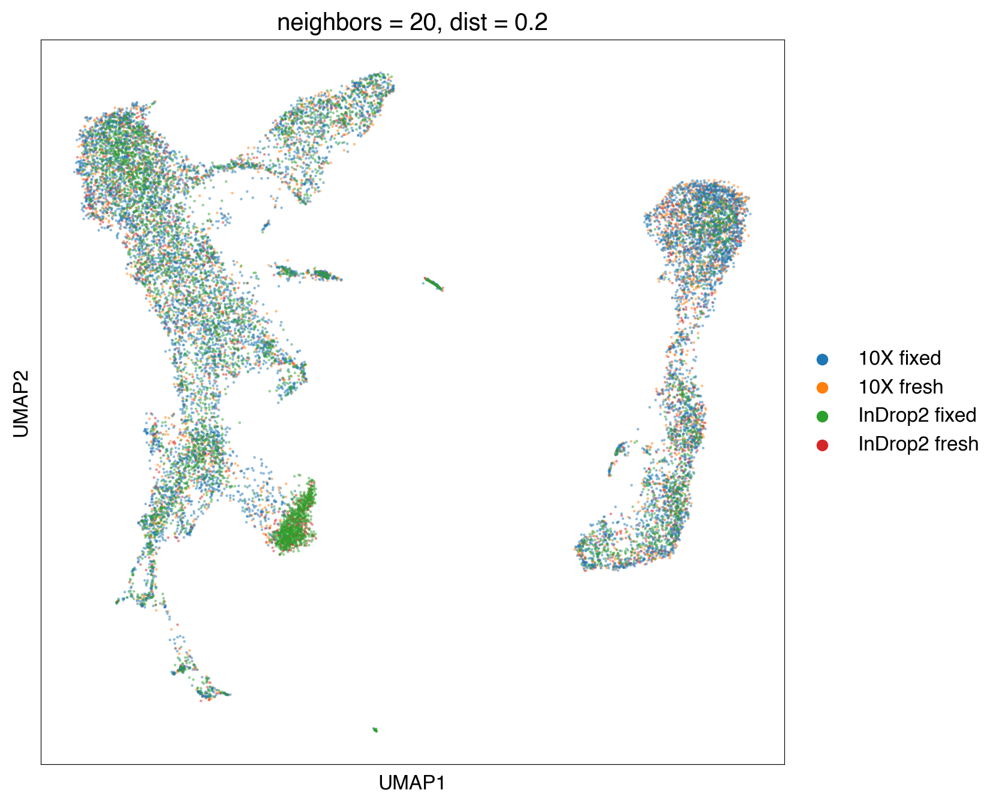

/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


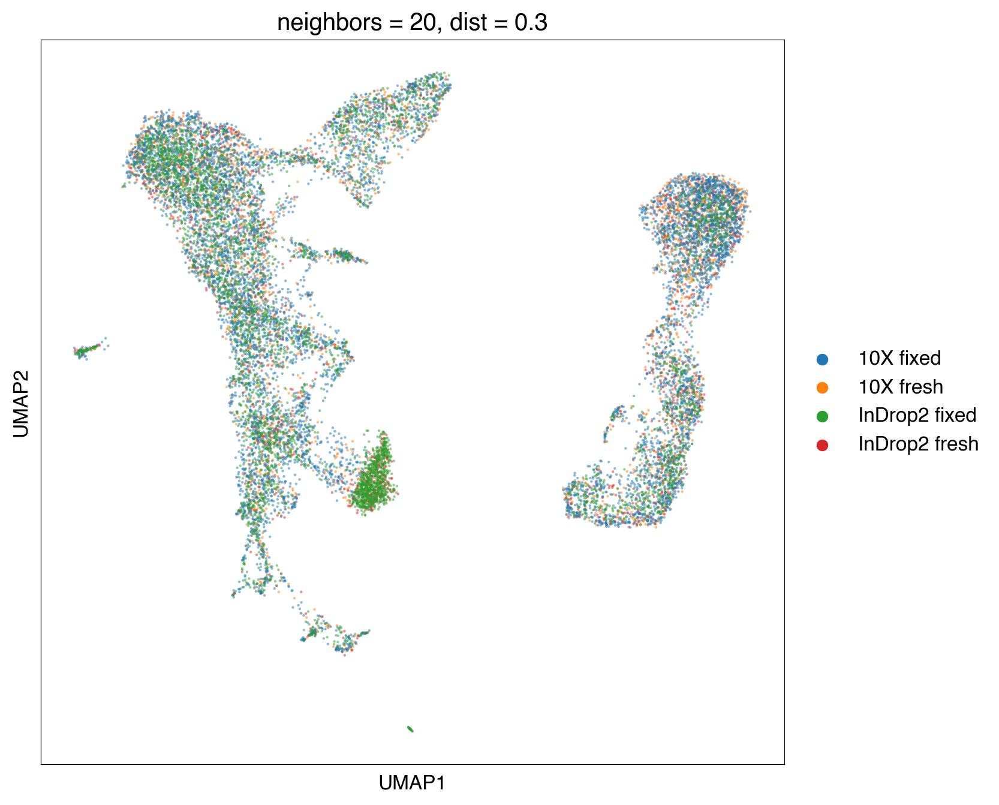

/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


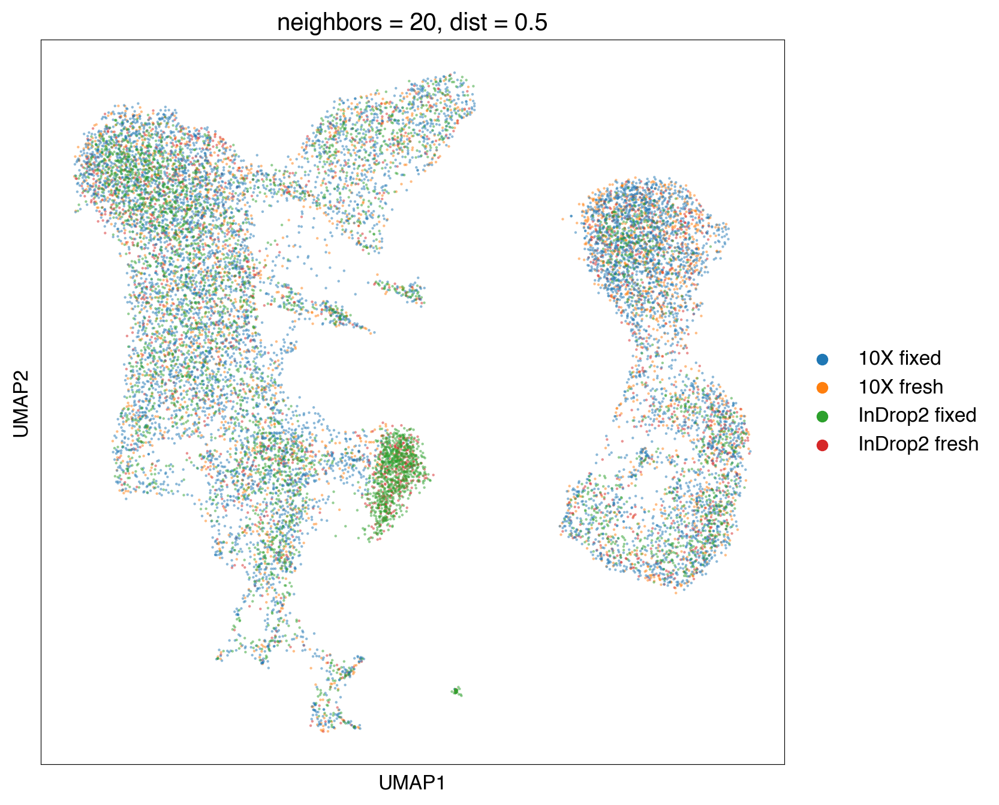

25 neighbors


/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


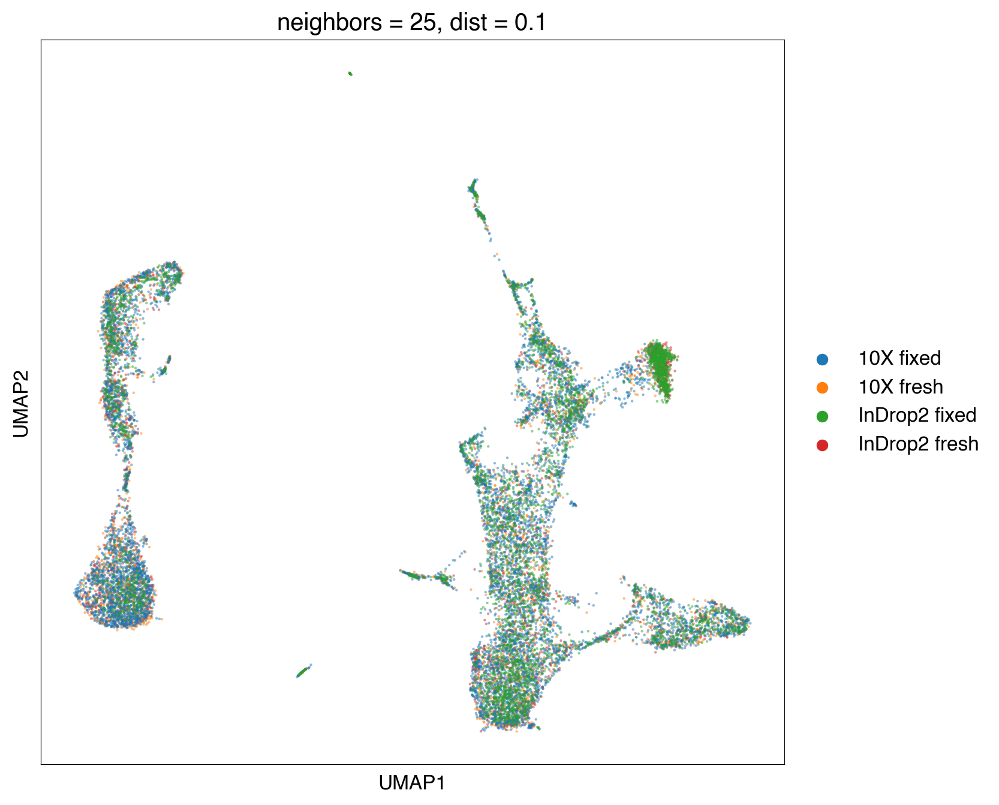

/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


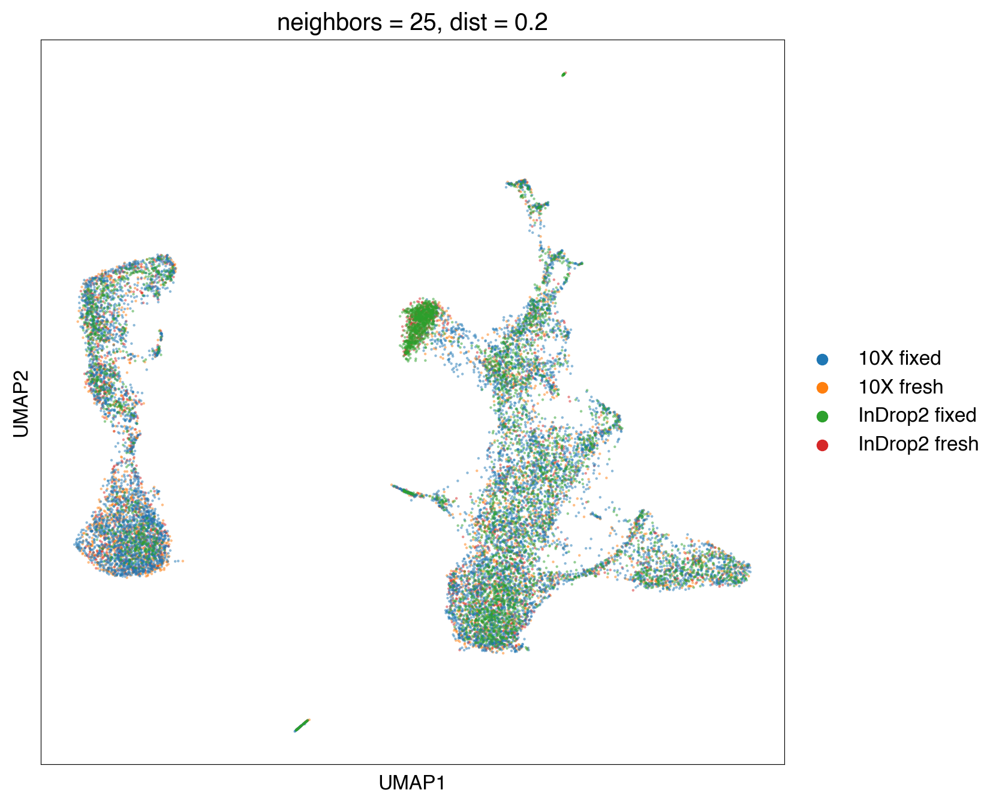

/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


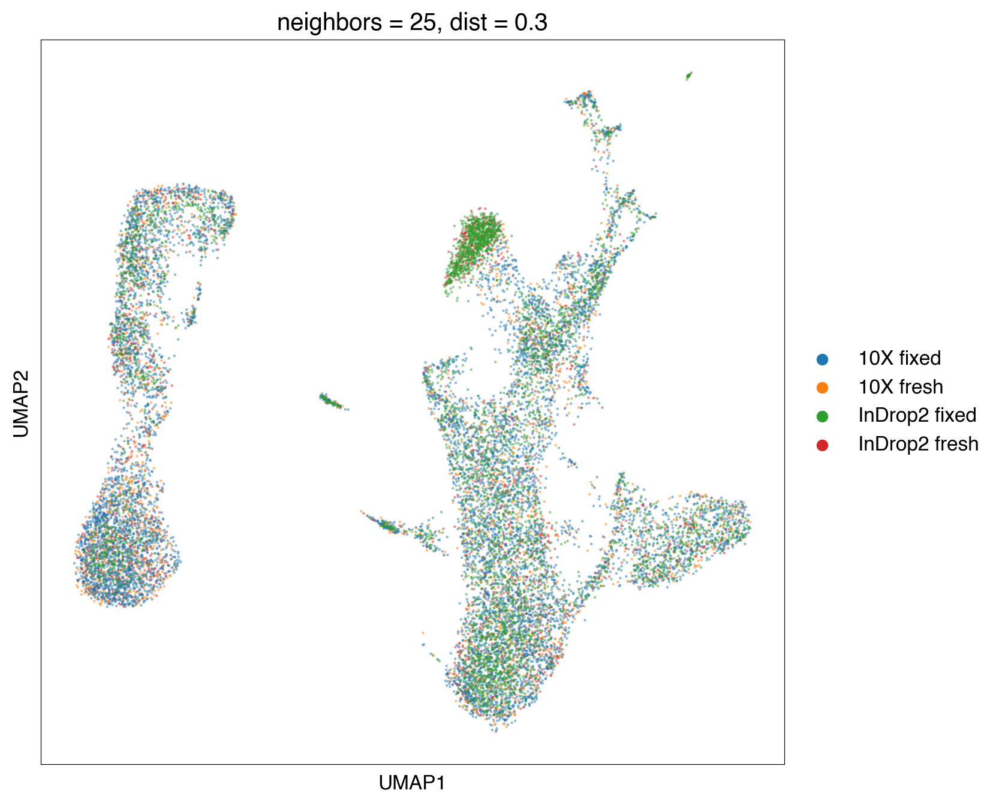

/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


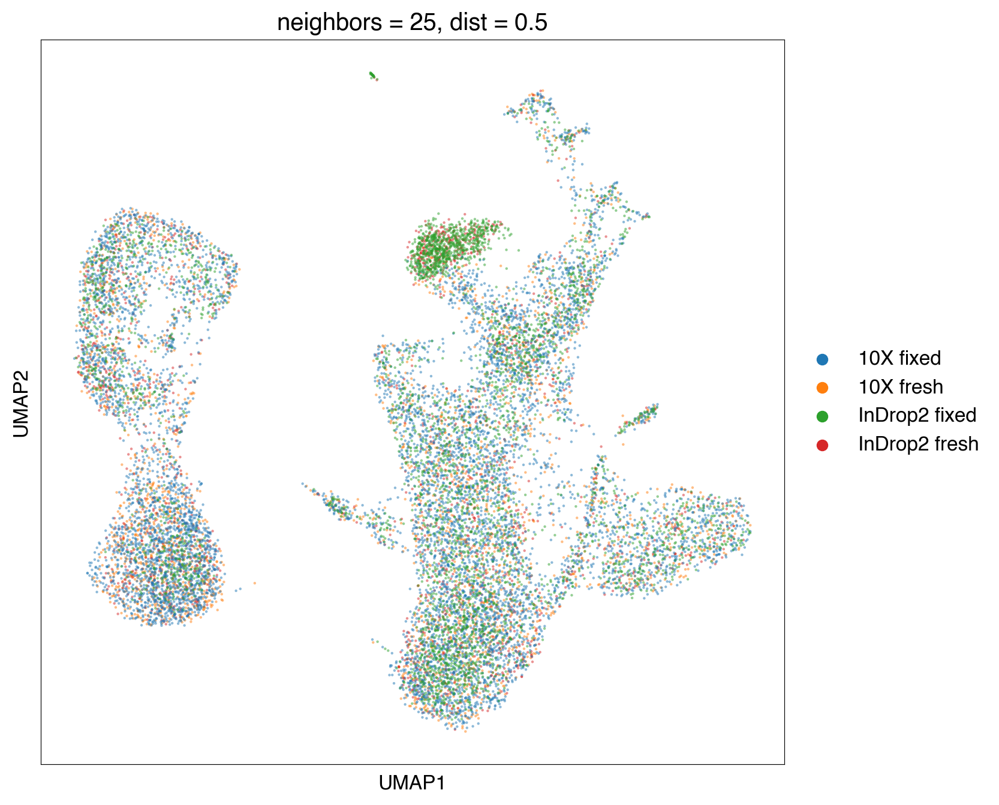

30 neighbors


/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


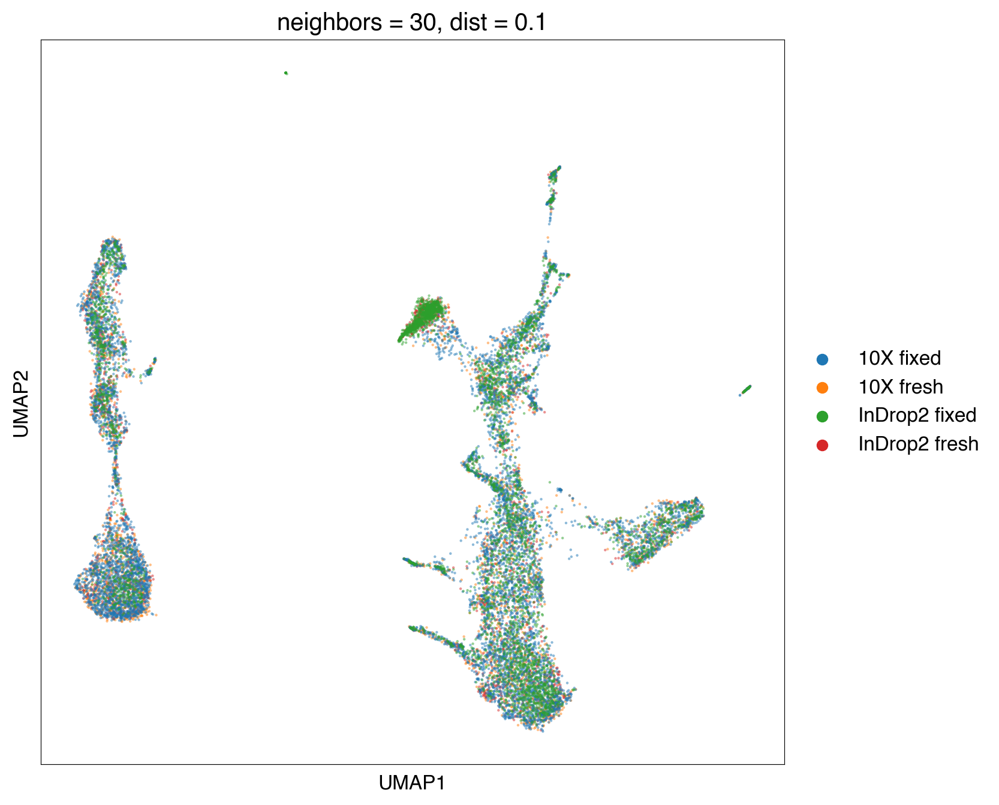

/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


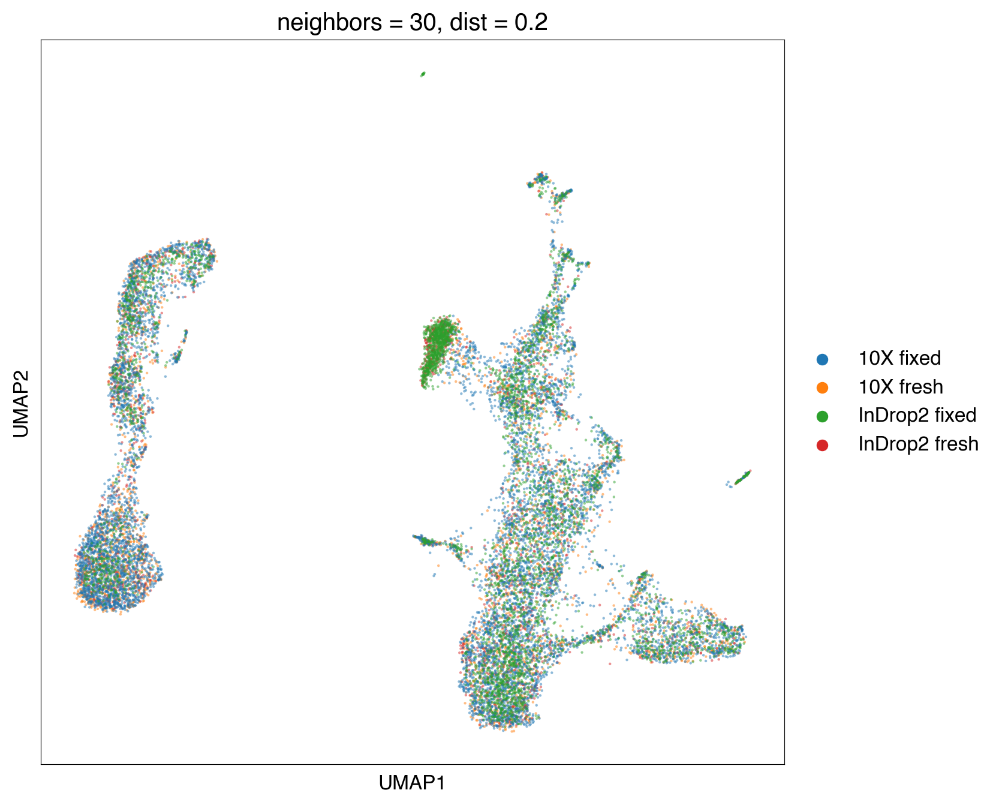

/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


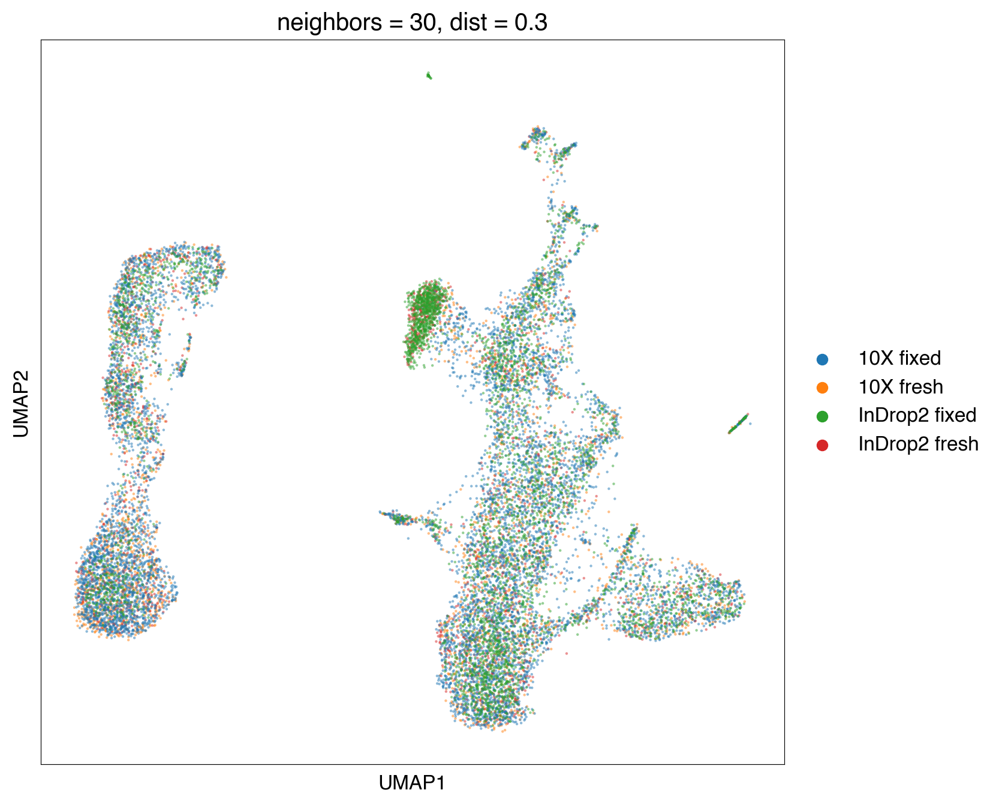

/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


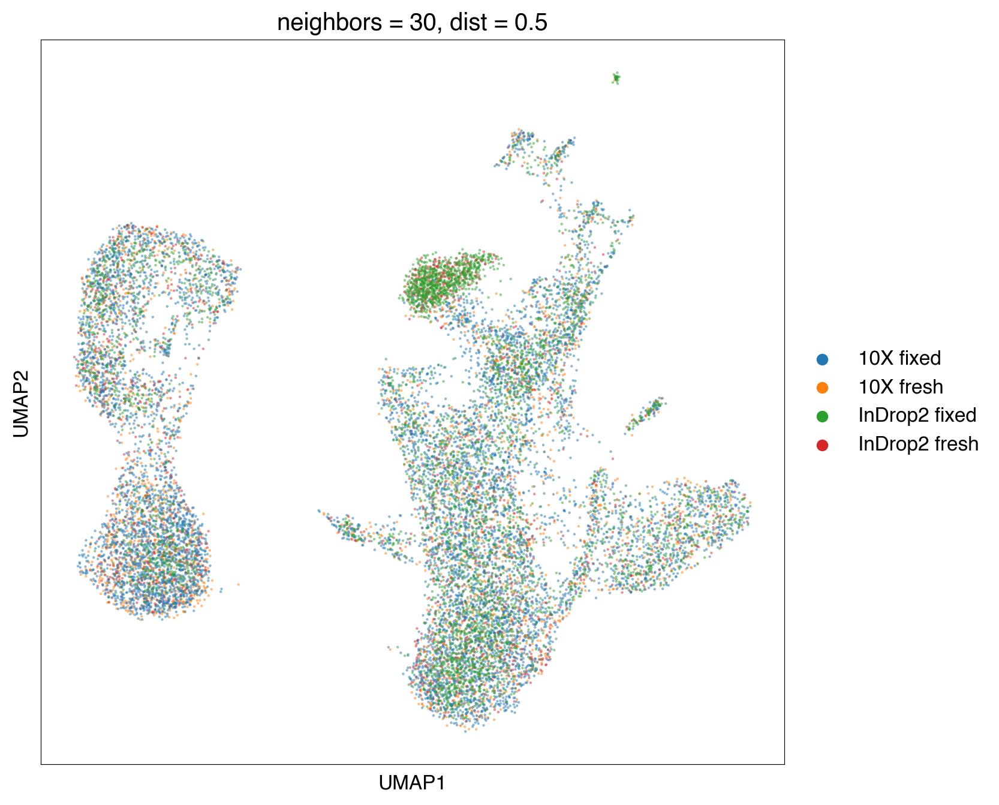

50 neighbors


/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


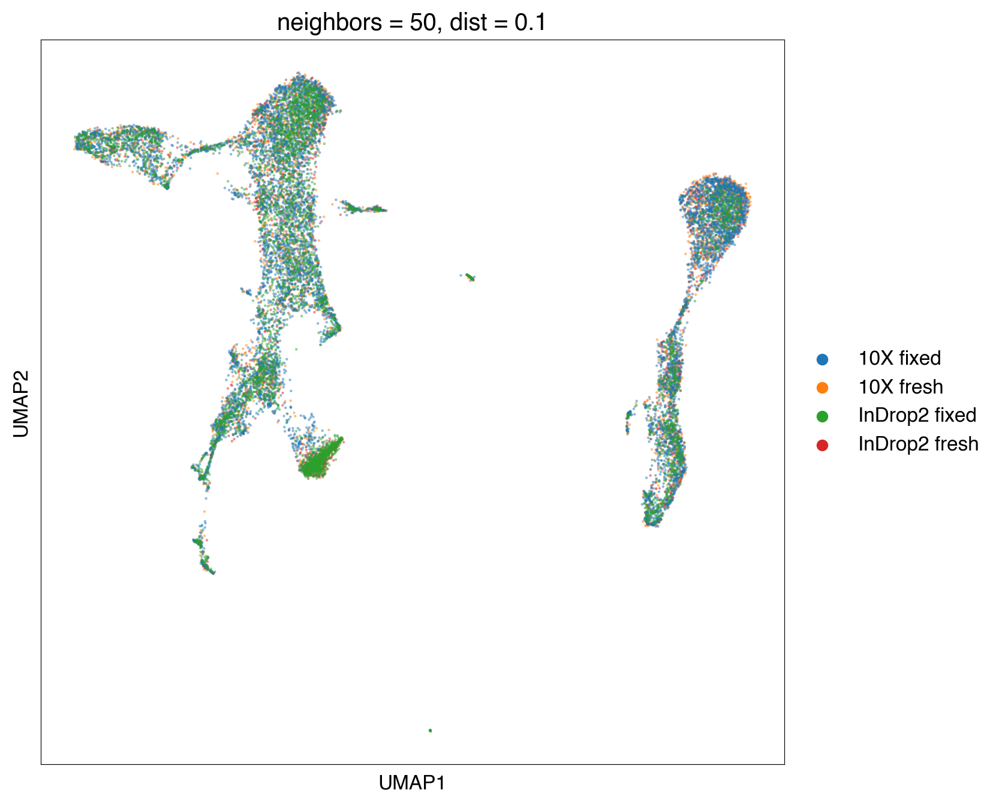

/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


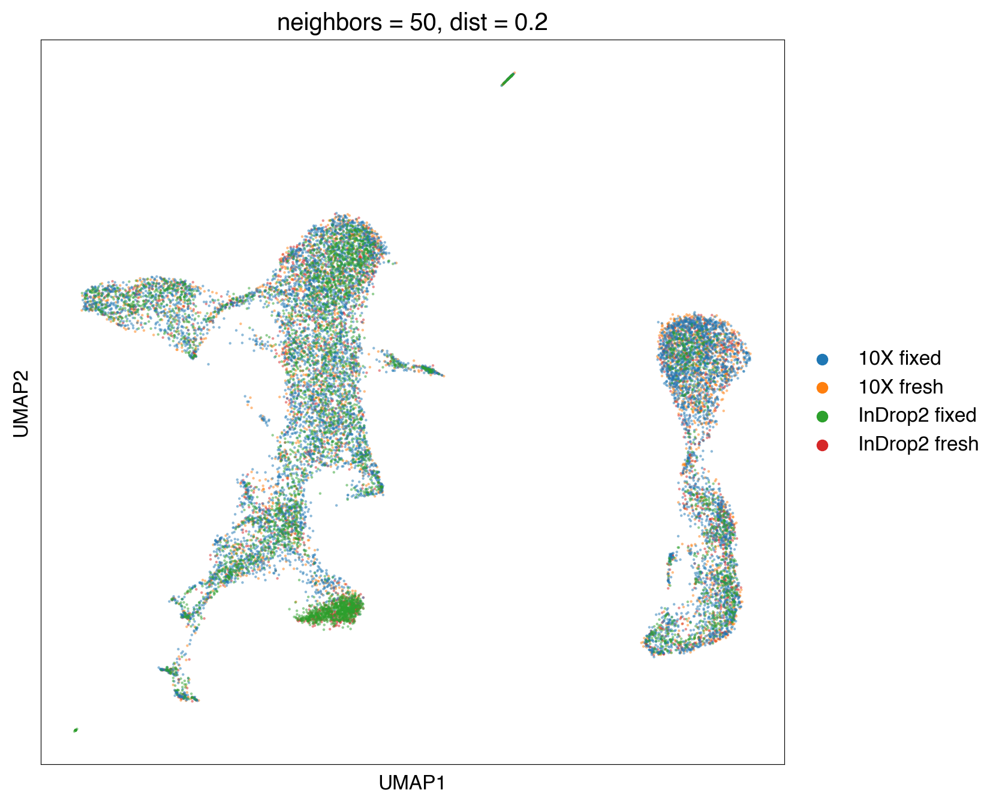

/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


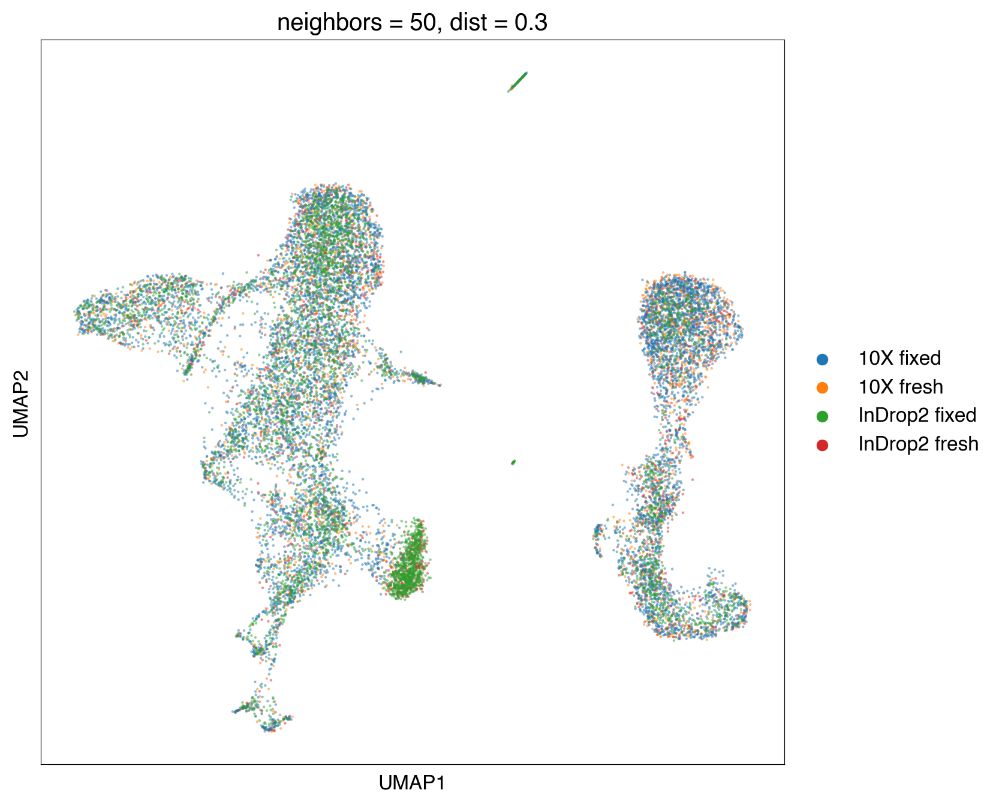

/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


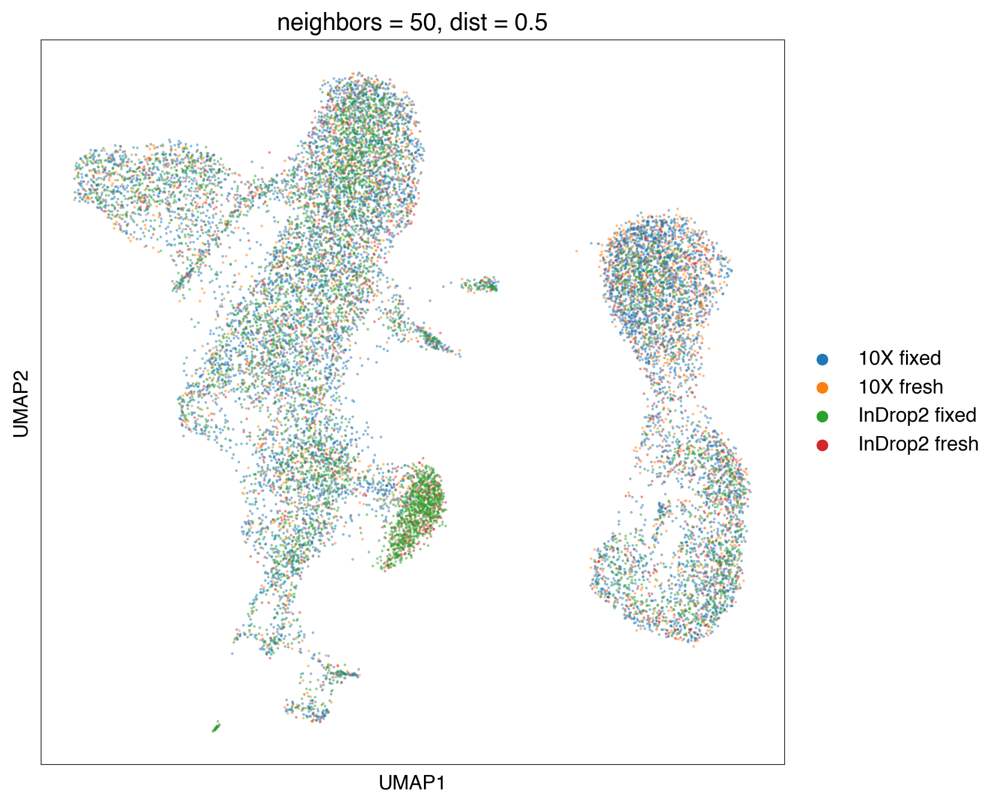

In [46]:
for j in neighbor_list:
    k = j
    print(k, 'neighbors')
    sc.pp.neighbors(cdata,k, use_rep = 'X_pca_harmony')
    for i in dist_list:
        sc.tl.umap(cdata, min_dist = i, random_state = 42)
        mpl.rcParams['figure.figsize'] = (8,8)
        plt.rcParams.update({'font.size': 12})
        mpl.rcParams['figure.dpi']= 200
        sc.pl.umap(cdata, color = 'conditions2', use_raw = False,
                   alpha = 0.5, s=10, title = 'neighbors = %s, dist = %s'% (j,i),
                   save ='clean_good_umap, neighbors = %s, dist = %s.png'% (j,i))
       

## Run UMAP with the chosen parameters

In [36]:
sc.pp.neighbors(cdata, 25 ,use_rep='X_pca_harmony')
sc.tl.umap(cdata, min_dist = 0.3, random_state = 42)



In [37]:
#record the parameters
pdict['neighbors'] = 25
pdict['min_dist'] = 0.3

In [47]:
plot_name = 'clean_good'
pdict['plot_name']= plot_name

<span style="color:red">
Important note:

This notebook was ran multiple times with different parameters to obtain the optimal representation.

   </span>

## Save UMAP for SPRING interactive viewer

In [39]:
cdata.obs.keys()

Index(['barcode', 'library', 'total_counts', 'pct_counts_mito', 'conditions',
       'conditions2', 'preservation', 'method', 'doublet_score',
       'potential_doublet', 'top3pct_dbtl_score', 'top5pct_dbtl_score',
       'top10pct_dbtl_score', 'sp_cl_all_cells_w_dblts_spring_500',
       'removed_as_dblt1', 'sp_cl_all_cells_wo_dblt1_spring_500',
       'removed_as_dblt2', 'no_dblt', 'n_counts', 'pheno_leiden',
       'pheno_leiden_res_0.1', 'pheno_leiden_res_0.2', 'pheno_leiden_res_0.3',
       'pheno_leiden_res_0.4', 'sp_cl_9', 'sp_cl_10', 'sp_cl_11', 'sp_cl_12',
       'sp_cl_13', 'cell_typist_pred'],
      dtype='object')

In [40]:
cdata

AnnData object with n_obs × n_vars = 15372 × 2000
    obs: 'barcode', 'library', 'total_counts', 'pct_counts_mito', 'conditions', 'conditions2', 'preservation', 'method', 'doublet_score', 'potential_doublet', 'top3pct_dbtl_score', 'top5pct_dbtl_score', 'top10pct_dbtl_score', 'sp_cl_all_cells_w_dblts_spring_500', 'removed_as_dblt1', 'sp_cl_all_cells_wo_dblt1_spring_500', 'removed_as_dblt2', 'no_dblt', 'n_counts', 'pheno_leiden', 'pheno_leiden_res_0.1', 'pheno_leiden_res_0.2', 'pheno_leiden_res_0.3', 'pheno_leiden_res_0.4', 'sp_cl_9', 'sp_cl_10', 'sp_cl_11', 'sp_cl_12', 'sp_cl_13', 'cell_typist_pred'
    var: 'mean', 'std'
    uns: 'X_lin_cptt', 'X_log_z', 'conditions2_colors', 'conditions_colors', 'draw_graph', 'neighbors', 'pca', 'preservation_colors', 'umap', 'log1p', 'spring_params'
    obsm: 'X_draw_graph_fa', 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'X_lin_cptt', 'X_log_z'
    obsp: 'connectivities', 'distances'

In [41]:
# continuous per-cell metadata
contvars = ['total_counts','pct_counts_mito', 'n_counts', 'doublet_score']

# categorical
catvars = ['library', 'conditions',
       'conditions2', 'preservation', 'method',
       'potential_doublet', 'top3pct_dbtl_score', 'top5pct_dbtl_score',
       'top10pct_dbtl_score',
       'sp_cl_all_cells_w_dblts_spring_500', 'removed_as_dblt1',
       'sp_cl_all_cells_wo_dblt1_spring_500', 'removed_as_dblt2',
       'no_dblt']


In [42]:
# export_spring_plot was complaining about the data format, force the right one
for contvar in contvars:
    cdata.obs[contvar] = cdata.obs[contvar].astype(float).values
    
for catvar in catvars:
    cdata.obs[catvar] = cdata.obs[catvar].astype('category').values

/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


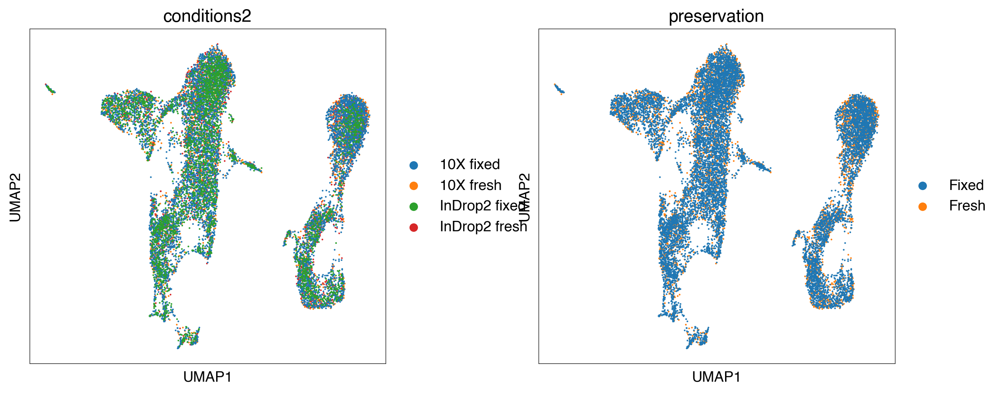

In [43]:
sc.pl.umap(cdata, color = ['conditions2', 'preservation'], ncols = 2, wspace = 0.3, save = False)

/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


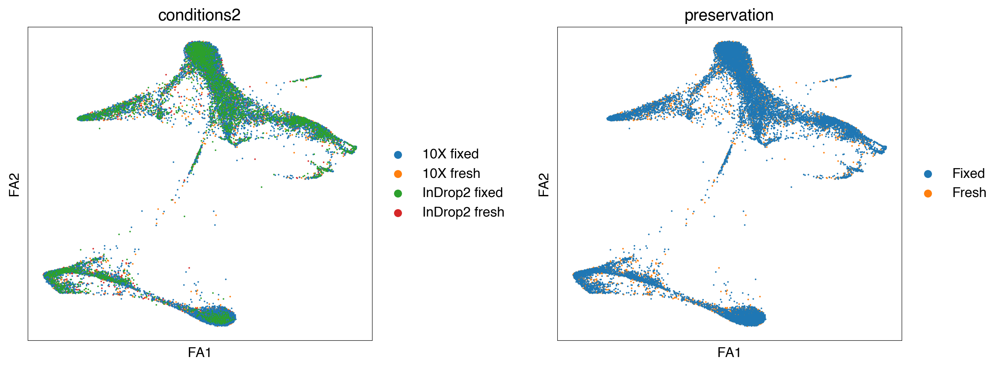

In [44]:
sc.pl.draw_graph(cdata, color=['conditions2', 'preservation'], wspace=0.4)

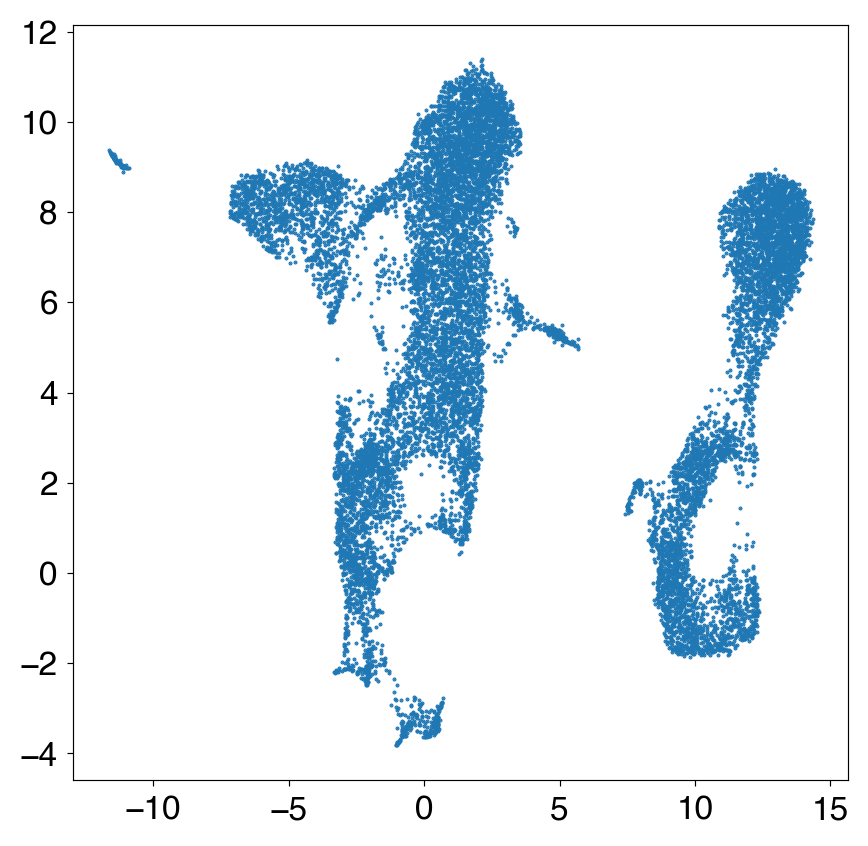

In [45]:
plt.scatter(cdata.obsm['X_umap'][:,0], cdata.obsm['X_umap'][0:,1], s = 0.2)

In [48]:
plot_name

'clean_good'

In [49]:
sce.exporting.spring_project(cdata, project_dir = project_dir, 
             embedding_method = 'X_draw_graph_fa', subplot_name = plot_name +'_spring', cell_groupings = catvars,
                            custom_color_tracks = contvars)

Writing subplot to /Users/karolisgoda/Library/CloudStorage/GoogleDrive-karolisgoda@gmail.com/My Drive/MF/data/SPRING_dev-master/data/CD34/clean/clean_good_spring


/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/external/exporting.py:159: FutureWarning: is_categorical is deprecated and will be removed in a future version. Use is_categorical_dtype instead.
  elif is_categorical(adata.obs[obs_name]):
/opt/anaconda3/envs/sc/lib/python3.8/site-packages/scanpy/external/exporting.py:175: FutureWarning: is_categorical is deprecated and will be removed in a future version. Use is_categorical_dtype instead.
  elif not is_categorical(adata.obs[obs_name]):


In [50]:
sce.exporting.spring_project(cdata, project_dir = project_dir, 
             embedding_method = 'X_umap', subplot_name = plot_name +'_umap', cell_groupings = catvars,
                            custom_color_tracks = contvars)

Writing subplot to /Users/karolisgoda/Library/CloudStorage/GoogleDrive-karolisgoda@gmail.com/My Drive/MF/data/SPRING_dev-master/data/CD34/clean/clean_good_umap


In [51]:
cdata

AnnData object with n_obs × n_vars = 15372 × 2000
    obs: 'barcode', 'library', 'total_counts', 'pct_counts_mito', 'conditions', 'conditions2', 'preservation', 'method', 'doublet_score', 'potential_doublet', 'top3pct_dbtl_score', 'top5pct_dbtl_score', 'top10pct_dbtl_score', 'sp_cl_all_cells_w_dblts_spring_500', 'removed_as_dblt1', 'sp_cl_all_cells_wo_dblt1_spring_500', 'removed_as_dblt2', 'no_dblt', 'n_counts', 'pheno_leiden', 'pheno_leiden_res_0.1', 'pheno_leiden_res_0.2', 'pheno_leiden_res_0.3', 'pheno_leiden_res_0.4', 'sp_cl_9', 'sp_cl_10', 'sp_cl_11', 'sp_cl_12', 'sp_cl_13', 'cell_typist_pred'
    var: 'mean', 'std'
    uns: 'X_lin_cptt', 'X_log_z', 'conditions2_colors', 'conditions_colors', 'draw_graph', 'neighbors', 'pca', 'preservation_colors', 'umap', 'log1p', 'spring_params'
    obsm: 'X_draw_graph_fa', 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'X_lin_cptt', 'X_log_z'
    obsp: 'connectivities', 'distances'

## Corrections to export properly

For some reason the plot in SPRING application is a mirror image of a plot I get plotting X_umap coordinates. Adjusting the coordinates to be portrayed properly in SPRING app. 

In [52]:
#for some reason the plot is a mirror image of X_umap coordinates, so let's make them look the same in SPRING app
embedding = cdata.obsm['X_umap']
coords = embedding - embedding.min(0)[None,:]
coords = coords * (np.array([1000, 1000]) / coords.ptp(0))[None,:] + np.array([200,-200])[None,:]
coords[:,1] = coords[:,1]*(-1)

In [53]:
#subplot path
subplot_path = project_dir  + '/' +plot_name + '_umap'
subplot_path

'/Users/karolisgoda/Library/CloudStorage/GoogleDrive-karolisgoda@gmail.com/My Drive/MF/data/SPRING_dev-master/data/CD34/clean/clean_good_umap'

In [54]:
#saving the new coordinates to subplot folder
np.savetxt('%s/coordinates.txt'%(subplot_path),
               np.hstack((np.arange(len(embedding))[:,None], coords)),
               fmt='%i,%.6f,%.6f')

In [55]:
#same with X_draw_graph_fa coordintates
embedding = cdata.obsm['X_draw_graph_fa']
coords = embedding - embedding.min(0)[None,:]
coords = coords * (np.array([1000, 1000]) / coords.ptp(0))[None,:] + np.array([200,-200])[None,:]
coords[:,1] = coords[:,1]*(-1)

In [56]:
#subplot path
subplot_path = project_dir  + '/' +plot_name + '_spring'
subplot_path

'/Users/karolisgoda/Library/CloudStorage/GoogleDrive-karolisgoda@gmail.com/My Drive/MF/data/SPRING_dev-master/data/CD34/clean/clean_good_spring'

In [57]:
#saving the new coordinates to subplot folder
np.savetxt('%s/coordinates.txt'%(subplot_path),
               np.hstack((np.arange(len(embedding))[:,None], coords)),
               fmt='%i,%.6f,%.6f')

In [68]:
#check in SPRING if looks the same as X_umap plot, it does now

In [58]:
#save the cdata
fname = 'backups/%s_batch_corrected_fa_umap_%dx%d_%s.h5ad'%(plot_name, cdata.shape[0],cdata.shape[1],rz.now())
fname                                                       

'backups/clean_good_batch_corrected_fa_umap_15372x2000_231009_12h05.h5ad'

In [59]:
cdata.uns.pop('spring_params') #for some reason adata.write does not allow dict of dicts
cdata.uns

{'X_lin_cptt': <18088x37733 sparse matrix of type '<class 'numpy.float32'>'
 	with 49422949 stored elements in Compressed Sparse Row format>,
 'X_log_z': array([[ 0.        ,  0.        ,  0.        , ..., -0.00743541,
         -0.18210891, -0.01665724],
        [ 0.        ,  0.        ,  0.        , ..., -0.00743541,
         -0.18210891, -0.01665724],
        [ 0.        ,  0.        ,  0.        , ..., -0.00743541,
         -0.18210891, -0.01665724],
        ...,
        [ 0.        ,  0.        ,  0.        , ..., -0.00743541,
         -0.18210891, -0.01665724],
        [ 0.        ,  0.        ,  0.        , ..., -0.00743541,
         -0.18210891, -0.01665724],
        [ 0.        ,  0.        ,  0.        , ..., -0.00743541,
         -0.18210891, -0.01665724]], dtype=float32),
 'conditions2_colors': array(['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728'], dtype=object),
 'conditions_colors': array(['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd'],
       dtype=object),
 'draw_g

In [60]:
cdata.write(fname)

In [61]:
#okay, apparently exporting spring plot did not work correctly and did not save the cell filter
cell_ix = np.arange(len(pdict['cell_mask']))[pdict['cell_mask']]


In [62]:
np.savetxt(subplot_path + '/cell_filter.txt', cell_ix, fmt='%i')
np.save(subplot_path + '/cell_filter.npy', cell_ix)

In [63]:
#also noticed the colorbar saturation levels are not right because my adata raw is not normalized, however
#I want to keep it that way so overwriting manually

In [64]:
adata.X.sum(axis=1)

matrix([[10000.   ],
        [10000.001],
        [10000.   ],
        ...,
        [10000.   ],
        [10000.   ],
        [10000.001]], dtype=float32)

In [65]:
E = adata.X.tocsc() #normalized

In [66]:
from scanpy.external.exporting import (_write_color_tracks,
                                 _get_color_stats_genes,
                                 _get_color_stats_custom,
                                 _write_color_stats
                                 )

In [67]:
gene_list = adata.var_names.values

In [68]:
continuous_extras = {}
for obs_name in contvars:
       continuous_extras[obs_name] = np.array(cdata.obs[obs_name])

In [69]:
# Create and write a dictionary of color profiles to be used by the visualizer
color_stats = {}
color_stats = _get_color_stats_genes(color_stats, E[cell_ix, :], gene_list)
color_stats = _get_color_stats_custom(color_stats, continuous_extras)
_write_color_stats(subplot_path + '/color_stats.json', color_stats)

In [ ]:
# save the pandas dataframe under adata.obs 
meta = adata.obs
fname_obs1 = 'backups/obs_info_clean_good_%dx%d_%s'%(meta.shape[0],meta.shape[1],rz.now())

print(fname_obs1)
rz.save_df(meta,fname_obs1)

In [72]:
rz.save_stuff(path=project_dir+'/' + plot_name +'_umap'+ '/params',stuff=pdict)

In [73]:
rz.save_stuff(path=project_dir+'/' + plot_name +'_spring'+ '/params',stuff=pdict)